In [1]:
import json
import base64
import os
import re
import pandas as pd

from IPython.display import Image, HTML, display


# Settings


## Define Functions


In [2]:
def load_json_file(file_path):
    """Load JSON data from a file."""
    try:
        with open(file_path, 'r') as file:
            return json.load(file)
    except FileNotFoundError:
        print(f"File not found: {file_path}")
        return None
    except json.JSONDecodeError:
        print(f"Invalid JSON in file: {file_path}")
        return None

def display_header(title, size=45):
    """Display a header in the notebook."""
    display(HTML(f"<h3 style='font-size: {size}px;'>{title}</h3>"))

def create_and_style_dataframe(data_dict, split_into_sections=True):
    """Create and style a DataFrame from a dictionary."""
    df = pd.DataFrame(list(data_dict.items()), columns=['Setting', 'Value'])
    df.reset_index(inplace=True)
    df.rename(columns={'index': 'No.'}, inplace=True)

    if split_into_sections:
        # Splitting the DataFrame into eighths and combining them side by side
        eighth_len = len(df) // 8
        eighths = [df.iloc[i*eighth_len:(i+1)*eighth_len] for i in range(8)]
        if len(df) % 8 != 0:
            eighths[-1] = pd.concat([eighths[-1], df.iloc[8*eighth_len:]])
        df_display = eighths[0].reset_index(drop=True)
        for i in range(1, 8):
            df_display = df_display.join(eighths[i].reset_index(drop=True), rsuffix=f'_{i+1}')
        return df_display.style.set_properties(**{'vertical-align': 'top'})
    else:
        return df.style.set_properties(**{'vertical-align': 'top'})

def extract_important_settings(settings, keys):
    """Extract important settings from the main settings."""
    return {key: settings.get(key, 'Not available') for key in keys}




In [3]:

# Hardcoded paths
json_file_path = '/NK_SingleDress_V2.json'  # Replace with your JSON file path

# Load JSON data
settings_json = load_json_file(json_file_path)
if settings_json is not None:
    display_header(json_file_path.split('/')[-1])

    # Truncate 'sample_prompts' and create DataFrame
    settings_json['sample_prompts'] = settings_json.get('sample_prompts', '')[:10]
    styled_df = create_and_style_dataframe(settings_json)
    display(styled_df)

    # Extract and display important settings in a regular list format
    important_keys = [
        'additional_parameters', 'logging_dir', 'min_snr_gamma', 'network_alpha', 
        'network_dim', 'optimizer', 'optimizer_args', 'pretrained_model_name_or_path', 
        'sdxl', 'train_data_dir', 'LoRA_type', 'lr_scheduler', 'learning_rate', 
        'keep_tokens', 'training_comment', 'train_batch_size', 'shuffle_caption', 'max_train_steps'
    ]
    important_settings = extract_important_settings(settings_json, important_keys)
    display_header("Important Settings")
    display(create_and_style_dataframe(important_settings, split_into_sections=False))


,No.,Setting,Value,No._2,Setting_2,Value_2,No._3,Setting_3,Value_3,No._4,Setting_4,Value_4,No._5,Setting_5,Value_5,No._6,Setting_6,Value_6,No._7,Setting_7,Value_7,No._8,Setting_8,Value_8
0,0,LoRA_type,Standard,15,color_aug,False,30,full_fp16,False,45,max_resolution,"1024,1024",60,network_alpha,128,75,rank_dropout,0,90,save_state,False,105,unet_lr,1.000000
1,1,LyCORIS_preset,full,16,constrain,0.000000,31,gradient_accumulation_steps,1,46,max_timestep,1000,61,network_dim,128,76,rank_dropout_scale,False,91,scale_v_pred_loss_like_noise_pred,False,106,unit,1
2,2,adaptive_noise_scale,0,17,conv_alpha,1,32,gradient_checkpointing,True,47,max_token_length,75,62,network_dropout,0,77,reg_data_dir,,92,scale_weight_norms,0,107,up_lr_weight,
3,3,additional_parameters,"--lr_scheduler_type ""CosineAnnealingLR"" --lr_scheduler_args ""T_max=14274"" --ddp_gradient_as_bucket_view --ddp_static_graph --wandb_run_name NK_Dress_V2",18,conv_block_alphas,,33,keep_tokens,1,48,max_train_epochs,,63,no_token_padding,False,78,rescaled,False,93,sdxl,True,108,use_cp,False
4,4,block_alphas,,19,conv_block_dims,,34,learning_rate,1.000000,49,max_train_steps,,64,noise_offset,0.035700,79,resume,,94,sdxl_cache_text_encoder_outputs,False,109,use_scalar,False
5,5,block_dims,,20,conv_dim,1,35,logging_dir,/home/daniarch/projects/kohya_ss_multi_GPU/NK/Dresses_datatset_single_view/log,50,mem_eff_attn,False,65,noise_offset_type,Original,80,sample_every_n_epochs,1,95,sdxl_no_half_vae,True,110,use_tucker,False
6,6,block_lr_zero_threshold,,21,debiased_estimation_loss,False,36,lora_network_weights,,51,mid_lr_weight,,66,num_cpu_threads_per_process,2,81,sample_every_n_steps,0,96,seed,1337,111,use_wandb,True
7,7,bucket_no_upscale,True,22,decompose_both,False,37,lr_scheduler,cosine_with_restarts,52,min_bucket_reso,256,67,optimizer,Prodigy,82,sample_prompts,wearing a,97,shuffle_caption,True,112,v2,False
8,8,bucket_reso_steps,64,23,dim_from_weights,False,38,lr_scheduler_args,,53,min_snr_gamma,5,68,optimizer_args,"decouple=True weight_decay=0.45 d_coef=4 use_bias_correction=True safeguard_warmup=True betas=0.9,0.99",83,sample_sampler,dpm_2,98,stop_text_encoder_training_pct,0,113,v_parameterization,False
9,9,cache_latents,True,24,down_lr_weight,,39,lr_scheduler_num_cycles,,54,min_timestep,0,69,output_dir,/home/daniarch/projects/kohya_ss_multi_GPU/NK/Dresses_datatset_single_view/model,84,save_every_n_epochs,1,99,text_encoder_lr,1.000000,114,v_pred_like_loss,0


,No.,Setting,Value
0,0,additional_parameters,"--lr_scheduler_type ""CosineAnnealingLR"" --lr_scheduler_args ""T_max=14274"" --ddp_gradient_as_bucket_view --ddp_static_graph --wandb_run_name NK_Dress_V2"
1,1,logging_dir,/home/daniarch/projects/kohya_ss_multi_GPU/NK/Dresses_datatset_single_view/log
2,2,min_snr_gamma,5
3,3,network_alpha,128
4,4,network_dim,128
5,5,optimizer,Prodigy
6,6,optimizer_args,"decouple=True weight_decay=0.45 d_coef=4 use_bias_correction=True safeguard_warmup=True betas=0.9,0.99"
7,7,pretrained_model_name_or_path,/home/daniarch/miniconda3/envs/autoLDM/stable-diffusion-webui/models/Stable-diffusion/sd_xl_base_1.0.safetensors
8,8,sdxl,True
9,9,train_data_dir,/home/daniarch/projects/kohya_ss_multi_GPU/NK/Dresses_datatset_single_view/NK


In [4]:

# Hardcoded paths
json_file_path = '/NK_Dress_TurnAround_V2.json'  # Replace with your JSON file path


# Load JSON data
settings_json = load_json_file(json_file_path)
if settings_json is not None:
    display_header(json_file_path.split('/')[-1])

    # Truncate 'sample_prompts' and create DataFrame
    settings_json['sample_prompts'] = settings_json.get('sample_prompts', '')[:10]
    styled_df = create_and_style_dataframe(settings_json)
    display(styled_df)

    # Extract and display important settings in a regular list format
    important_keys = [
        'additional_parameters', 'logging_dir', 'min_snr_gamma', 'network_alpha', 
        'network_dim', 'optimizer', 'optimizer_args', 'pretrained_model_name_or_path', 
        'sdxl', 'train_data_dir', 'LoRA_type', 'lr_scheduler', 'learning_rate', 
        'keep_tokens', 'training_comment', 'train_batch_size', 'shuffle_caption', 'max_train_steps'
    ]
    important_settings = extract_important_settings(settings_json, important_keys)
    display_header("Important Settings")
    display(create_and_style_dataframe(important_settings, split_into_sections=False))


,No.,Setting,Value,No._2,Setting_2,Value_2,No._3,Setting_3,Value_3,No._4,Setting_4,Value_4,No._5,Setting_5,Value_5,No._6,Setting_6,Value_6,No._7,Setting_7,Value_7,No._8,Setting_8,Value_8
0,0,LoRA_type,Standard,15,color_aug,False,30,full_fp16,False,45,max_resolution,"1024,1024",60,network_alpha,128,75,rank_dropout,0,90,save_state,False,105,unet_lr,1.000000
1,1,LyCORIS_preset,full,16,constrain,0.000000,31,gradient_accumulation_steps,1,46,max_timestep,1000,61,network_dim,128,76,rank_dropout_scale,False,91,scale_v_pred_loss_like_noise_pred,False,106,unit,1
2,2,adaptive_noise_scale,0,17,conv_alpha,1,32,gradient_checkpointing,True,47,max_token_length,75,62,network_dropout,0,77,reg_data_dir,,92,scale_weight_norms,0,107,up_lr_weight,
3,3,additional_parameters,"--lr_scheduler_type ""CosineAnnealingLR"" --lr_scheduler_args ""T_max=14274"" --ddp_gradient_as_bucket_view --ddp_static_graph --wandb_run_name NK_TurnAround_V2",18,conv_block_alphas,,33,keep_tokens,1,48,max_train_epochs,,63,no_token_padding,False,78,rescaled,False,93,sdxl,True,108,use_cp,False
4,4,block_alphas,,19,conv_block_dims,,34,learning_rate,1.000000,49,max_train_steps,,64,noise_offset,0.035700,79,resume,,94,sdxl_cache_text_encoder_outputs,False,109,use_scalar,False
5,5,block_dims,,20,conv_dim,1,35,logging_dir,/home/daniarch/projects/kohya_ss_multi_GPU/NK/multiview/log,50,mem_eff_attn,False,65,noise_offset_type,Original,80,sample_every_n_epochs,1,95,sdxl_no_half_vae,True,110,use_tucker,False
6,6,block_lr_zero_threshold,,21,debiased_estimation_loss,False,36,lora_network_weights,,51,mid_lr_weight,,66,num_cpu_threads_per_process,2,81,sample_every_n_steps,0,96,seed,1337,111,use_wandb,True
7,7,bucket_no_upscale,True,22,decompose_both,False,37,lr_scheduler,cosine_with_restarts,52,min_bucket_reso,256,67,optimizer,Prodigy,82,sample_prompts,wearing a,97,shuffle_caption,True,112,v2,False
8,8,bucket_reso_steps,64,23,dim_from_weights,False,38,lr_scheduler_args,,53,min_snr_gamma,5,68,optimizer_args,"decouple=True weight_decay=0.45 d_coef=4 use_bias_correction=True safeguard_warmup=True betas=0.9,0.99",83,sample_sampler,dpm_2,98,stop_text_encoder_training,0,113,v_parameterization,False
9,9,cache_latents,True,24,down_lr_weight,,39,lr_scheduler_num_cycles,,54,min_timestep,0,69,output_dir,/home/daniarch/projects/kohya_ss_multi_GPU/NK/multiview/NK/model,84,save_every_n_epochs,1,99,text_encoder_lr,1.000000,114,v_pred_like_loss,0


,No.,Setting,Value
0,0,additional_parameters,"--lr_scheduler_type ""CosineAnnealingLR"" --lr_scheduler_args ""T_max=14274"" --ddp_gradient_as_bucket_view --ddp_static_graph --wandb_run_name NK_TurnAround_V2"
1,1,logging_dir,/home/daniarch/projects/kohya_ss_multi_GPU/NK/multiview/log
2,2,min_snr_gamma,5
3,3,network_alpha,128
4,4,network_dim,128
5,5,optimizer,Prodigy
6,6,optimizer_args,"decouple=True weight_decay=0.45 d_coef=4 use_bias_correction=True safeguard_warmup=True betas=0.9,0.99"
7,7,pretrained_model_name_or_path,/home/daniarch/miniconda3/envs/autoLDM/stable-diffusion-webui/models/Stable-diffusion/sd_xl_base_1.0.safetensors
8,8,sdxl,True
9,9,train_data_dir,/home/daniarch/projects/kohya_ss_multi_GPU/NK/multiview/NK/


## V2 NK_SingleDress and NK_Dress_TurnAround were combined with JessyNK LoRA's at .50, .50, .50 mix

# Prompts used:

### 1. jessynk, character turn around, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, on top of a volcano Hawaii 

### 2. jessynk, nkdress, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, on top of a volcano Hawaii 

### 3. (jessynk) wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  ((nkdress))

### 4. (jessynk) wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  ((character turn around))

### 5. jessynk, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, in the studio, nkdress

### 6. jessynk, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, in the studio, character turn around

### 7. nkdress, jessynk, wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  

### 8. nkdress, character turn around, wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio 

### Steps: 20, Sampler: dpmpp_sde_gpu, CFG scale: 8, Seed: random, Size: 1024x1024, Model hash: 31e35c80fc, VAE hash: 235745af8d, VAE: sdxl_vae.safetensors 

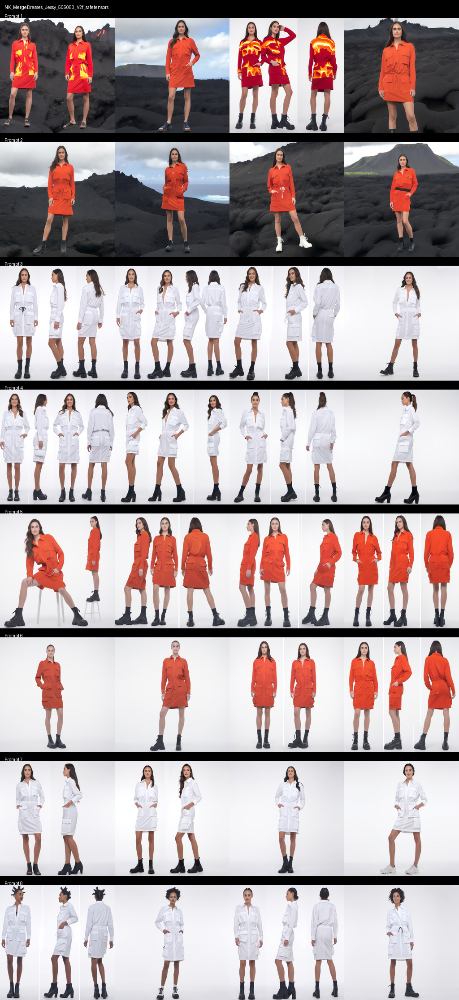

In [5]:
# Replace 'path_to_image' with the actual path to your image file
image_path = '/grid_image.png'

# Display the image
display(Image(filename=image_path))


# Prompts used With Negatives:

### 1. jessynk, character turn around, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, on top of a volcano Hawaii 
###    neg: nkdress

### 2. jessynk, nkdress, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, on top of a volcano Hawaii 
###    neg: character turn around

### 3. (jessynk) wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  ((nkdress))
###    neg: character turn around

### 4. (jessynk) wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  ((character turn around))
###    neg: nkdress

### 5. jessynk, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, in the studio, nkdress
###    neg: character turn around

### 6. jessynk, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, in the studio, character turn around
###    neg: nkdress

### 7. nkdress, jessynk, wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  
###    neg: character turn around

### 8. nkdress, character turn around, wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  
###    neg: nkdress

### Steps: 20, Sampler: dpmpp_sde_gpu, CFG scale: 8, Seed: random, Size: 1024x1024, Model hash: 31e35c80fc, VAE hash: 235745af8d, VAE: sdxl_vae.safetensors 

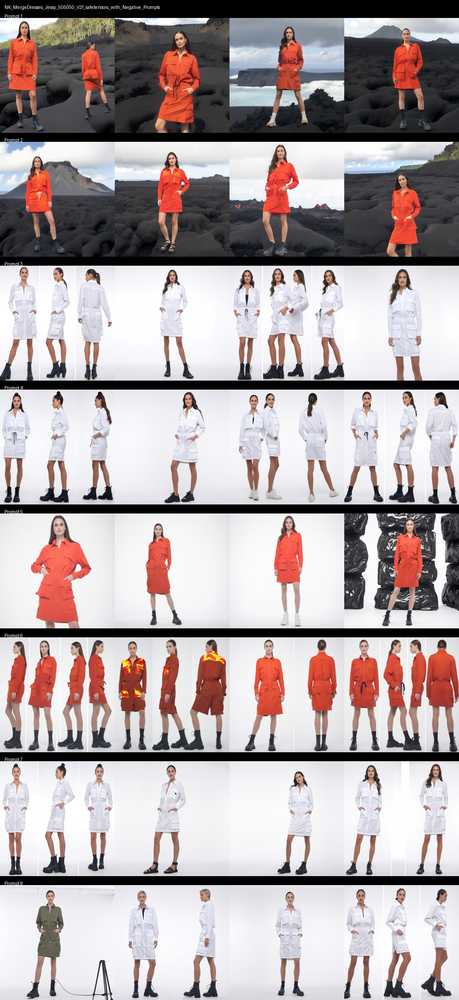

In [6]:


# Replace 'path_to_image' with the actual path to your image file
image_path = '/grid_image.png'

# Display the image
display(Image(filename=image_path))


# Obervations
### when prompting for single view in this case 'nkdress' get more multi views than would be idea. negative prompt 'chacacter turn around' does clean up the output a bit. surpsingly, prompting for multiple view with 'character turn around' works well, and 'nkdress' in the negative does not seem to help- almost feels like it makes it worse. 

### Hypothesis: better caption scratedgy. in nkdress i would add '1 girl' or '1 view' and in multiple view folder i would add '2 view', '4 view' depending on the image (the multiview dataset varies a bit from 2-3 views). Perhaps 'character turn around' is to close to the animation class of a character turn around. but when i tried 'grid view' on V1 it was less effective for giving up consistent grid view. 

# NK_SingleDress and NK_DressTurnAround plus jessynK LoRA's combined at .35 .35 .30

# Prompts used:

### 1. jessynk, character turn around, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, on top of a volcano Hawaii 

### 2. jessynk, nkdress, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, on top of a volcano Hawaii 

### 3. (jessynk) wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  ((nkdress))

### 4. (jessynk) wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  ((character turn around))

### 5. jessynk, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, in the studio, nkdress

### 6. jessynk, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, in the studio, character turn around

### 7. nkdress, jessynk, wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  

### 8. nkdress, character turn around, wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio 

### Steps: 20, Sampler: dpmpp_sde_gpu, CFG scale: 8, Seed: random, Size: 1024x1024, Model hash: 31e35c80fc, VAE hash: 235745af8d, VAE: sdxl_vae.safetensors 

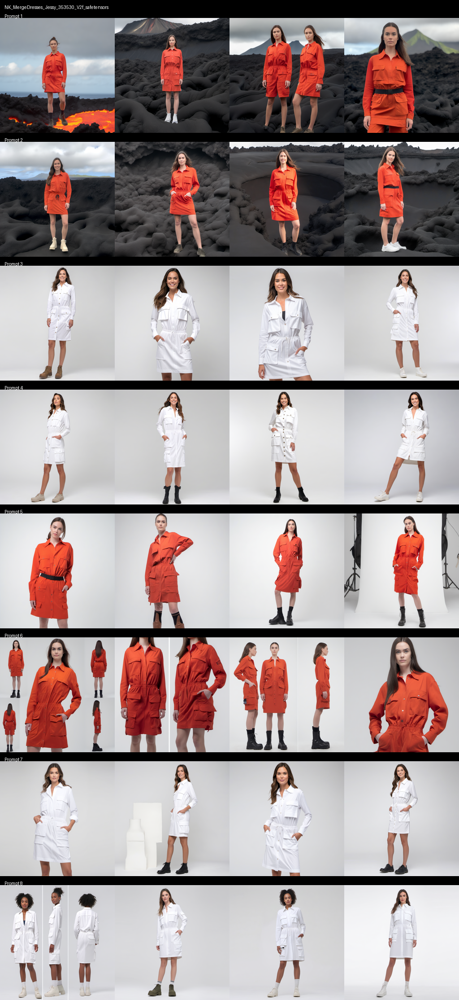

In [7]:
# Replace 'path_to_image' with the actual path to your image file
image_path = '/grid_image.png'

# Display the image
display(Image(filename=image_path))


# Prompts used With Negatives:

### 1. jessynk, character turn around, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, on top of a volcano Hawaii 
###    neg: nkdress

### 2. jessynk, nkdress, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, on top of a volcano Hawaii 
###    neg: character turn around

### 3. (jessynk) wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  ((nkdress))
###    neg: character turn around

### 4. (jessynk) wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  ((character turn around))
###    neg: nkdress

### 5. jessynk, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, in the studio, nkdress
###    neg: character turn around

### 6. jessynk, wearing red cargo Dress made out of (molten lava:1.4) To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White, in the studio, character turn around
###    neg: nkdress

### 7. nkdress, jessynk, wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  
###    neg: character turn around

### 8. nkdress, character turn around, wearing a (NK Cargo Dress To Knee, Long Sleeve, Cargo Pocket, Elastic Waist, Shirt Collar, Flap Pocket, Straight Hem, White), in a photo studio  
###    neg: nkdress

### Steps: 20, Sampler: dpmpp_sde_gpu, CFG scale: 8, Seed: random, Size: 1024x1024, Model hash: 31e35c80fc, VAE hash: 235745af8d, VAE: sdxl_vae.safetensors 

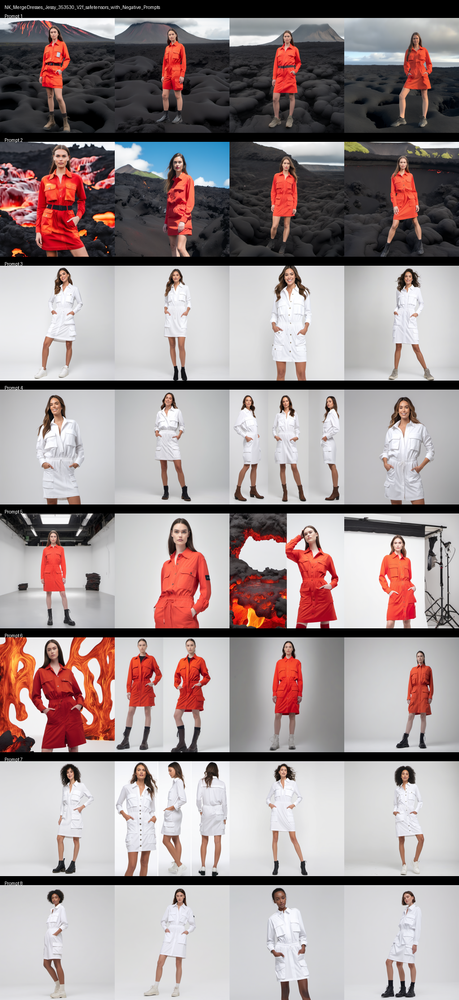

In [8]:


# Replace 'path_to_image' with the actual path to your image file
image_path = '//grid_image.png'

# Display the image
display(Image(filename=image_path))

In [10]:
!jupyter nbconvert --to html /NK_V2.ipynb --TagRemovePreprocessor.remove_input_tags='{"hide_code"}' --ExtractOutputPreprocessor.enabled=True


[NbConvertApp] Converting notebook /home/daniarch/projects/kohya_ss_multi_GPU/Note_book/NK_V2/NK_V2_copy.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 4 image(s).
[NbConvertApp] Support files will be in NK_V2_copy_files/
[NbConvertApp] Making directory /home/daniarch/projects/kohya_ss_multi_GPU/Note_book/NK_V2/NK_V2_copy_files
[NbConvertApp] Writing 389041 bytes to /home/daniarch/projects/kohya_ss_multi_GPU/Note_book/NK_V2/NK_V2_copy.html
